# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)
8. [Ejercicio #1](#eje1)
9. [Ejercicio #2](#eje2)
10. [Ejercicio #3](#eje3)
11. [Ejercicio #4](#eje4)

**Equipo #14**

José Luis Parada Gutiérrez - A00939669

Julian Jesús Moreno Ovando - A01795915

Mario Raúl García Ramírez - A01658682

Juan Pablo Carvajal Acosta - A01796843


## Libraries <a name="libraries"></a>


In [26]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [27]:
import os
from google.colab import drive
drive.mount('/content/drive')
DIR = "/content/drive/MyDrive/Vision"
os.chdir(DIR)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##Loading Images <a name="loading"></a>

<class 'numpy.ndarray'>


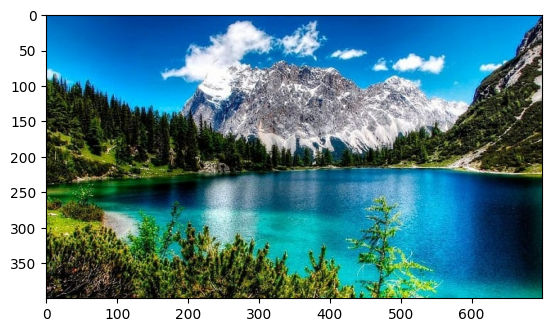

In [28]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [29]:
img1.shape

(400, 700, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

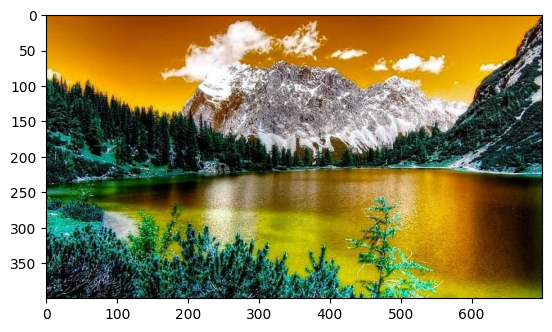

In [30]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(shape=(400, 700, 3))


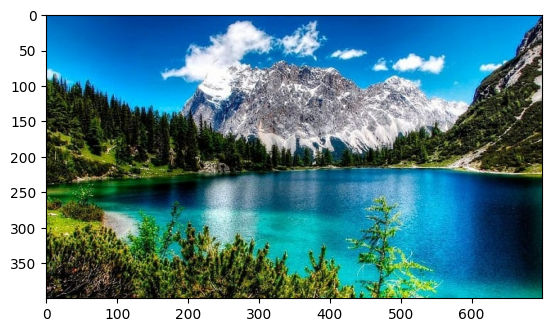

In [31]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


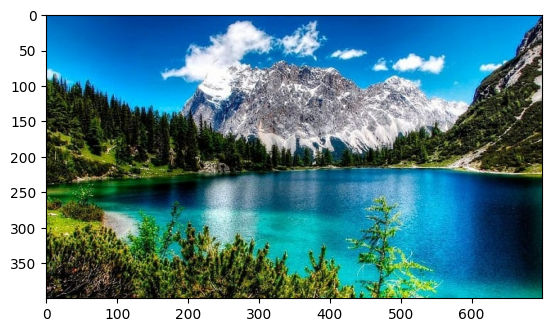

In [32]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [33]:
img3 = np.array(img3)
img3.shape

(400, 700, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

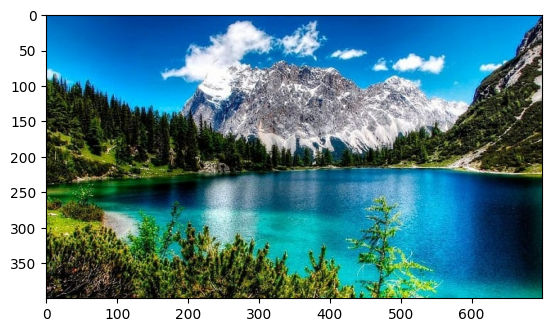

In [34]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing Images <a name="resize"></a>

One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 700 x 400
New size: 200 x 200


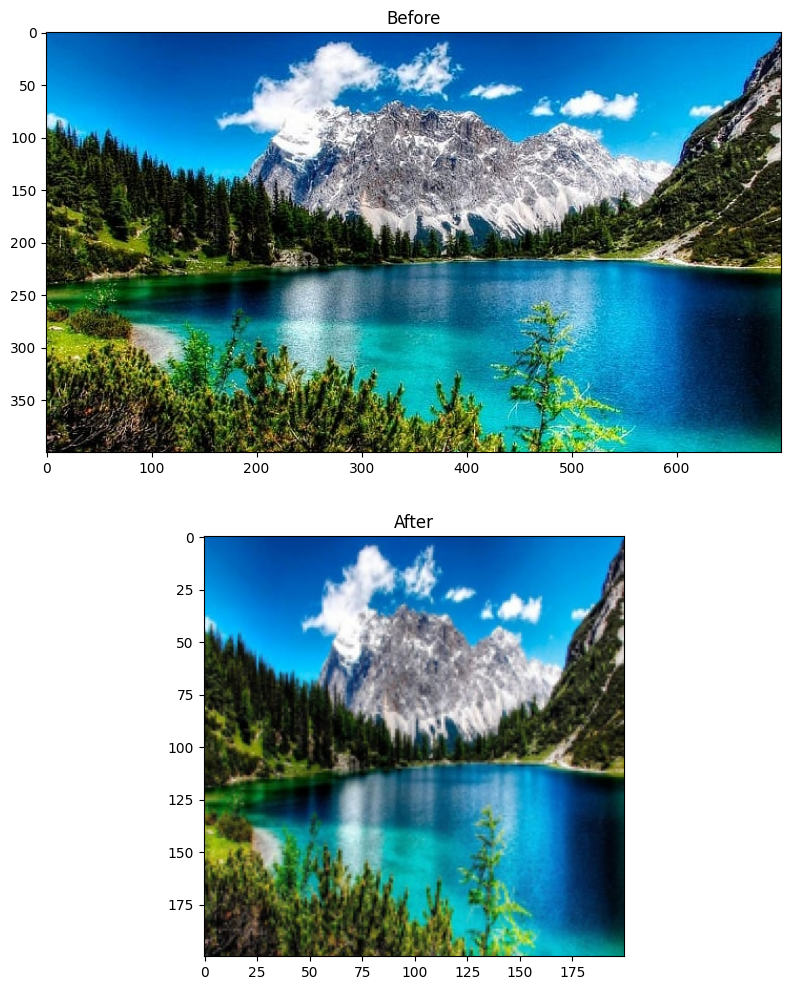

In [35]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 400 x 700
Scaled size: 114 x 200
New size: 200 x 200


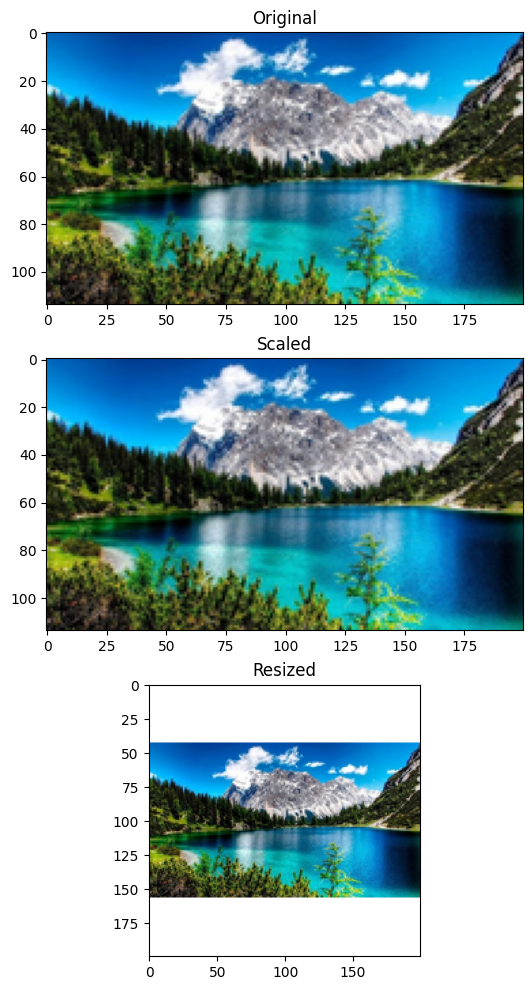

In [36]:
# Get the image size
orig_width, orig_height = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.Resampling.LANCZOS)
scaled_width, scaled_height = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a name="negative"></a>


In [37]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

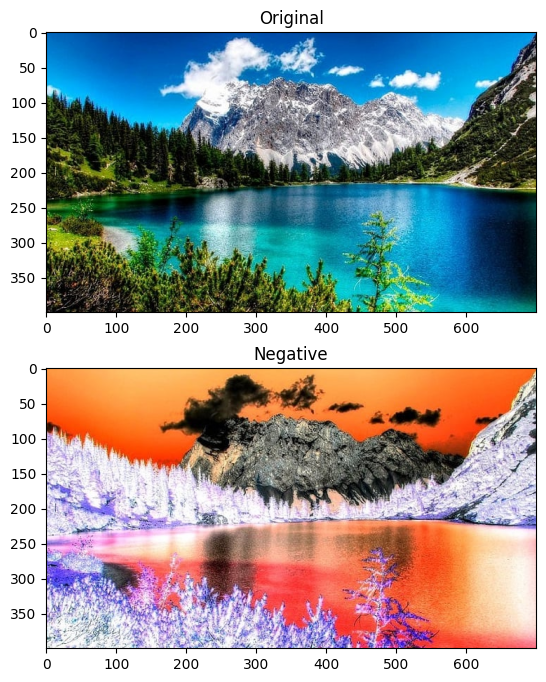

In [38]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a name="log"></a>


$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [39]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
#c = 255 / np.log(1 + np.max(orig_img))
#log_img = c * (np.log(orig_img + 1))

img_float = orig_img.astype(np.float32)
c = 255 / np.log(1 + np.max(img_float))
log_img = c * np.log(1 + img_float)

# Specify the data type so that
# float value will be converted to int
#log_img = np.array(log_img, dtype = np.uint8)

log_img = cv2.normalize(log_img, None, 0, 255, cv2.NORM_MINMAX)
log_img = np.uint8(log_img)

Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

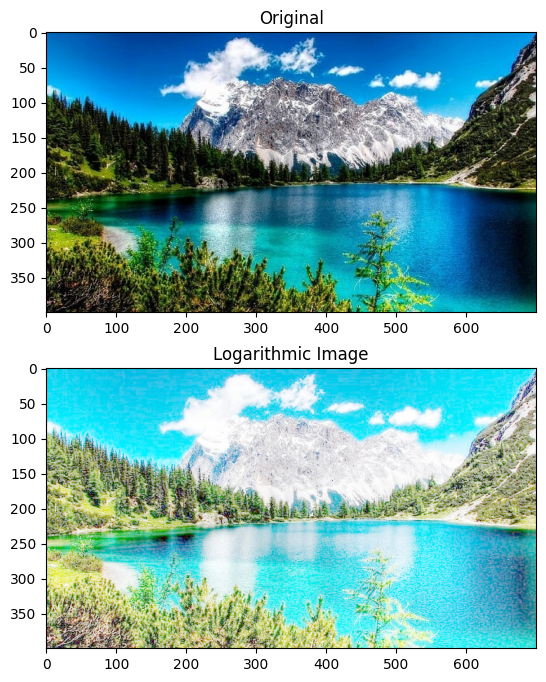

In [40]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a name="bin"></a>


Binarize pixels (set pixel values to 0 or 1) according to a threshold.

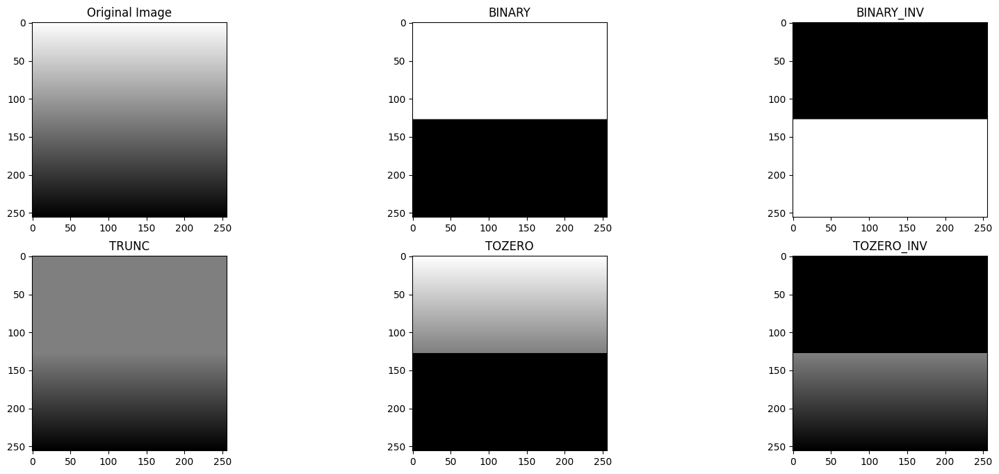

In [41]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer <a name="quant"></a>

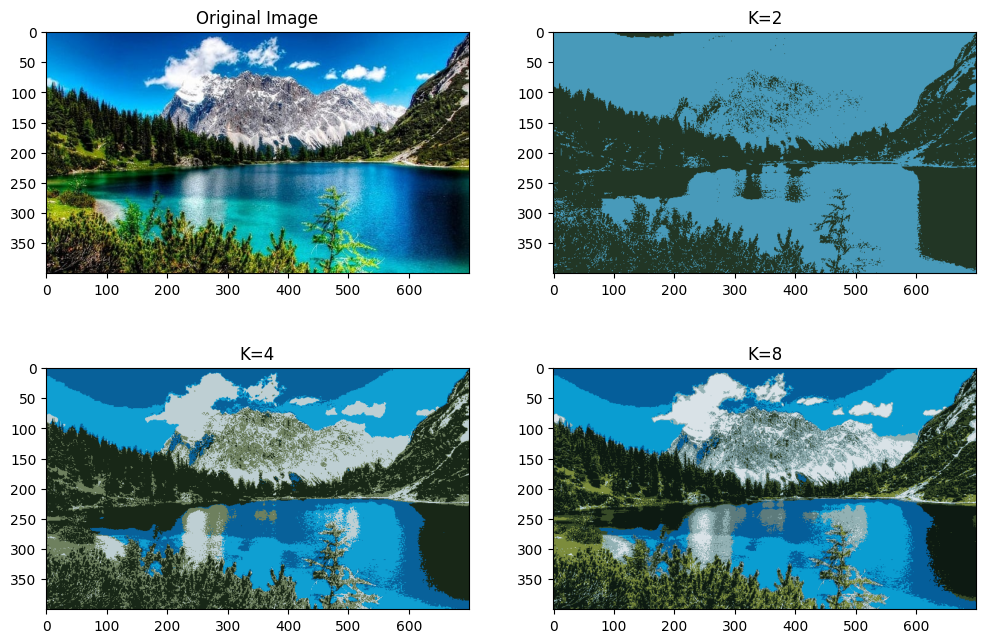

In [42]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

## Ejercicio #1 <a name="eje1"></a>



### Ajuste de Alpha ($\alpha$) y Beta ($\beta$) – Transformación Lineal  

El ajuste de **α (ganancia)** y **β (desplazamiento)** es una **transformación lineal de intensidad** que se aplica píxel por píxel y se define como:  

$$
s = \alpha \cdot r + \beta
$$  

donde:  
- \($r$\) es la intensidad del píxel de entrada.  
- \($\alpha$\) controla el **contraste** (α > 1 aumenta contraste, α < 1 lo disminuye).  
- \($\beta$\) controla el **brillo** (β > 0 aclara, β < 0 oscurece).  

Esta transformación es muy usada para **ajustar contraste y brillo simultáneamente** en imágenes digitales.  


Ejemplo de ajuste de Brillo

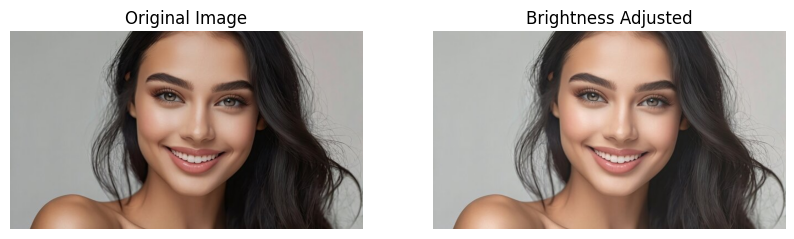

In [43]:
orig_img = cv2.imread('data2/image1.jpg')

# Brightness adjustment value
brightness = 20  # Positive to increase, negative to decrease

# Create a new image with adjusted brightness
bright_img = cv2.convertScaleAbs(orig_img, alpha=1, beta=brightness)

# Plot original and adjusted images side by side
plt.figure(figsize=(10,5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Brightness adjusted image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(bright_img, cv2.COLOR_BGR2RGB))
plt.title('Brightness Adjusted')
plt.axis('off')

plt.show()

Ejemplo de ajuste de Contraste

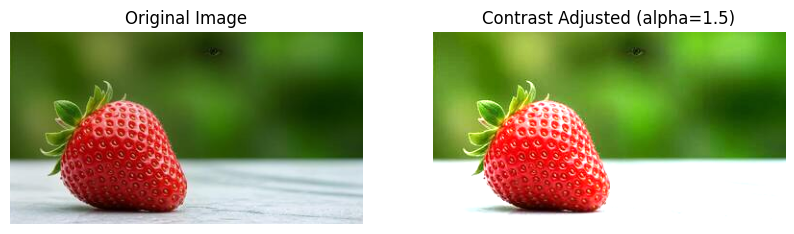

In [44]:
orig_img = cv2.imread('data2/image2.jpg')

# Parameters
alpha = 1.5  # Contrast control (>1 increases contrast, <1 reduces it)

# Apply contrast adjustment
contrast_img = cv2.convertScaleAbs(orig_img, alpha=alpha)

# Plot original and adjusted images side by side
plt.figure(figsize=(10,5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Contrast adjusted image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(contrast_img, cv2.COLOR_BGR2RGB))
plt.title(f'Contrast Adjusted (alpha={alpha})')
plt.axis('off')

plt.show()

Ajuste de Brillo y Contraste

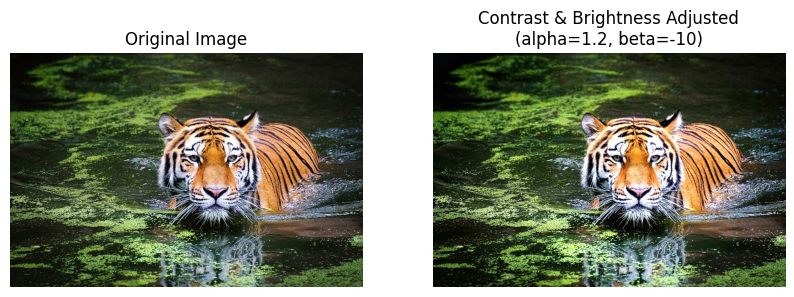

In [45]:
import cv2
import matplotlib.pyplot as plt

# Load original image
orig_img = cv2.imread('data2/image3.jpg')

# Parameters
alpha = 1.2  # Contrast control (>1 increases contrast, <1 reduces it)
beta = -10    # Brightness control (positive = brighter, negative = darker)

# Apply contrast and brightness adjustment
contrast_img = cv2.convertScaleAbs(orig_img, alpha=alpha, beta=beta)

# Plot original and adjusted images side by side
plt.figure(figsize=(10,5))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Adjusted image
plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(contrast_img, cv2.COLOR_BGR2RGB))
plt.title(f'Contrast & Brightness Adjusted\n(alpha={alpha}, beta={beta})')
plt.axis('off')

plt.show()

### Conversión de Imagen a Escala de Grises

El cambio de **imagen a color (RGB)** a **escala de grises** se realiza combinando los tres canales de color en un solo canal de intensidad.  

La fórmula estándar utilizada es:

\[
I(x,y) = 0.299 \cdot R(x,y) + 0.587 \cdot G(x,y) + 0.114 \cdot B(x,y)
\]

donde:  
- **R(x,y)**: intensidad del píxel en el canal rojo.  
- **G(x,y)**: intensidad del píxel en el canal verde.  
- **B(x,y)**: intensidad del píxel en el canal azul.  
- **I(x,y)**: intensidad del píxel en escala de grises.  

Los coeficientes reflejan la sensibilidad del ojo humano:  
- El verde aporta más a la percepción de brillo (**0.587**).  
- El rojo tiene influencia media (**0.299**).  
- El azul aporta menos (**0.114**).  

Esta transformación convierte la imagen en un solo canal, **simplificando el procesamiento** y reduciendo el costo computacional. Se utiliza en tareas como:  
- Detección de bordes  
- Segmentación  
- Análisis de patrones


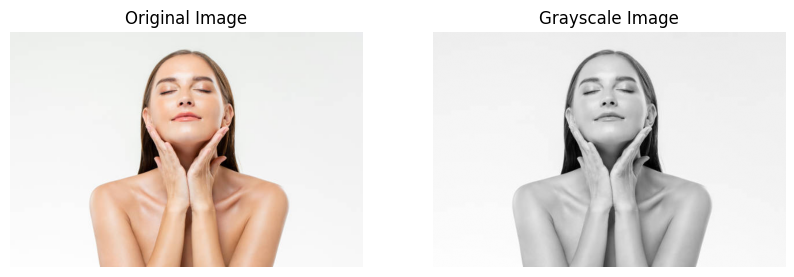

In [46]:
import cv2
import matplotlib.pyplot as plt

# Load original image
img = cv2.imread('data2/image4.jpg')

# Convert to grayscale
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Plot original and grayscale images side by side
plt.figure(figsize=(10,5))

# Original image (in color)
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

# Grayscale image
plt.subplot(1, 2, 2)
plt.imshow(gray_img, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.show()


### Normalización de Imagen – Escalamiento Lineal

La **normalización de imagen** es una transformación que ajusta los valores de intensidad de los píxeles a un rango definido (comúnmente entre 0 y 1).  

La fórmula es:

\[
I'(x,y) = \frac{I(x,y) - I_{\min}}{I_{\max} - I_{\min}}
\]

donde:  
- **I(x,y)**: intensidad original del píxel.  
- **I' (x,y)**: intensidad normalizada del píxel.  
- **Iₘᵢₙ**: valor mínimo de intensidad en la imagen.  
- **Iₘₐₓ**: valor máximo de intensidad en la imagen.  

#### Características:
- Se eliminan dependencias de la escala original de los píxeles.  
- Los valores quedan en un rango estándar (0 a 1).  
- Facilita la comparación entre diferentes imágenes.  
- Es muy usada en **preprocesamiento para redes neuronales** y algoritmos de visión.  

#### Ejemplo de uso:
- Si una imagen tiene intensidades entre **50 y 200**, al normalizar:  
  - 50 se convierte en 0.0  
  - 200 se convierte en 1.0  
  - Los valores intermedios se escalan proporcionalmente.  


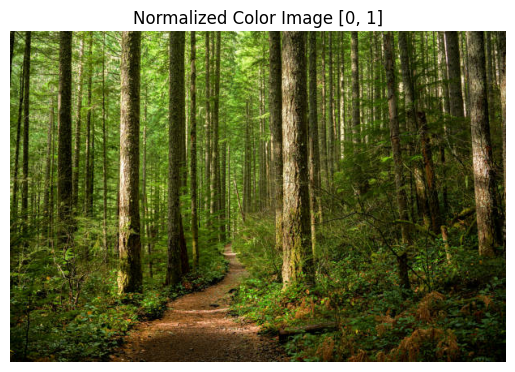

In [47]:
img = cv2.imread('data2/image5.jpg')

#Convert to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

#Normalize the RGB image
img_norm_rgb = cv2.normalize(img_rgb.astype('float32'), None, 0.0, 1.0, cv2.NORM_MINMAX)

# Display
plt.imshow(img_norm_rgb)
plt.title('Normalized Color Image [0, 1]')
plt.axis('off')
plt.show()

## Ejercicio #2 <a name="eje2"></a>
### Conversión de Imagen a Negativo

**Descripcion:**

Una aplicacion donde conviene convertir una imagen en negativo es en radiologia. se usa el negativo porque al invertir los tonos claros y oscuros se hacen más visibles detalles pequeños que podrían pasar desapercibidos. Es una forma rápida y sencilla de mejorar el contraste para que el ojo humano detecte mejor las lesiones sin modificar la imagen original.

### Conversión de Imagen a Negativo

La conversión a **imagen negativa** consiste en invertir los valores de intensidad de cada píxel.  
La fórmula matemática es:

\[
I'(x,y) = L - 1 - I(x,y)
\]

donde:  
- **I(x,y)**: intensidad original del píxel (entre 0 y L-1).  
- **I'(x,y)**: intensidad del píxel en la imagen negativa.  
- **L**: número de niveles de intensidad (para imágenes de 8 bits, \(L = 256\)).  

#### Características:
- Los valores claros se vuelven oscuros y viceversa.  
- Resalta estructuras que pueden pasar desapercibidas en la imagen original.  
- Se utiliza como técnica de **mejora de contraste** rápida y no destructiva.  

#### Aplicación:
En **radiología**, la conversión a negativo permite que pequeños detalles, como microfracturas o lesiones, se vuelvan más visibles para el ojo humano.  
Al invertir los tonos claros y oscuros, se mejora la percepción visual de estructuras sutiles sin alterar la información original de la imagen.  

Esto convierte al negativo en una herramienta sencilla pero muy útil para la **detección temprana de anomalías médicas**.  


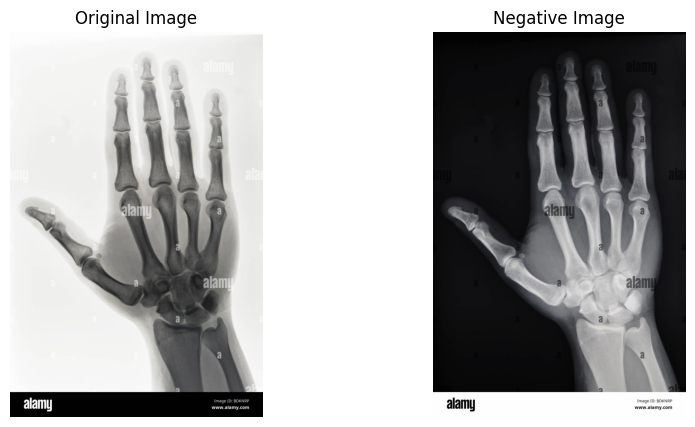

In [48]:
orig_img = cv2.imread('data2/image8.jpg')

# Convert to negative
negative_img = 255 - orig_img

# Display original and negative side by side
plt.figure(figsize=(10,5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(negative_img, cv2.COLOR_BGR2RGB))
plt.title('Negative Image')
plt.axis('off')

plt.show()

### Justificación

Se utiliza la conversión a negativo porque al invertir los colores de la imagen, los tonos claros se vuelven oscuros y viceversa, lo que provoca que ciertos detalles resalten con mayor claridad.  
Esto ayuda al ojo humano a detectar estructuras pequeñas o diferencias sutiles en la intensidad que en la imagen original podrían pasar desapercibidas.  

En radiología, esta técnica resulta especialmente útil, ya que permite a los médicos identificar con más facilidad lesiones, microfracturas u otras anomalías sin modificar la información real de la imagen.


## Ejercicio #3 <a name="eje3"></a>
### Ajuste de Gamma

**Descripcion:**

La corrección de gamma sirve para que una foto o imagen no se vea demasiado oscura o demasiado brillosa. Básicamente es como ajustar la luz. si una parte salió muy oscura, se aclara sin arruinar lo demás, y si está muy brillante, se suaviza. Se usa mucho en fotos, pantallas y edición para que la imagen se vea más natural y agradable a la vista.

### Ajuste de Gamma – Corrección de Brillo No Lineal

La **corrección de gamma** se utiliza para que una imagen no se vea demasiado oscura o demasiado brillante.  
Básicamente, es como ajustar la luz de manera más natural:  
- Si una parte de la imagen salió muy oscura, se aclara sin arruinar el resto.  
- Si está demasiado brillante, se suaviza para que no deslumbre.  

La fórmula matemática es:

\[
I'(x,y) = c \cdot [I(x,y)]^{\gamma}
\]

donde:  
- **I(x,y)**: intensidad original del píxel (normalizada entre 0 y 1).  
- **I'(x,y)**: intensidad del píxel después de la corrección gamma.  
- **γ (gamma)**: parámetro que ajusta la luz de forma no lineal.  
- **c**: constante de normalización (generalmente 1).  

#### Características:
- **γ < 1**: aclara la imagen (mejora detalles en zonas oscuras).  
- **γ > 1**: oscurece la imagen (reduce exceso de brillo).  
- Produce un ajuste visual más parecido a la percepción humana de la luz.  

#### Aplicación:
La corrección de gamma se usa mucho en **fotografía, pantallas y edición de imágenes**, ya que ayuda a que la imagen se vea más **natural y agradable a la vista**, mejorando la experiencia visual sin alterar la información real de la imagen.  


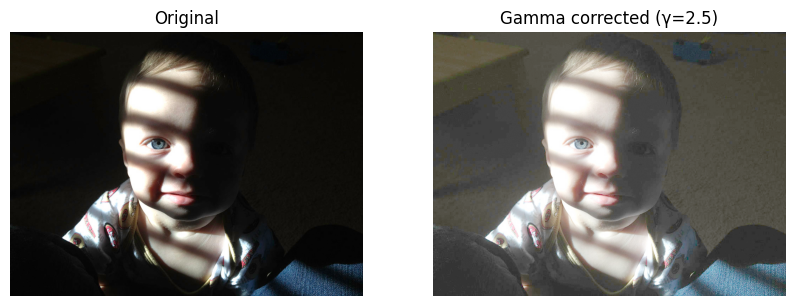

In [49]:
def gamma_correction(img, gamma: float):
    """
    Apply gamma correction to a uint8 image using a fast LUT.
    gamma < 1.0 -> brightens shadows
    gamma > 1.0 -> darkens highlights
    """
    if img.dtype != np.uint8:
        img8 = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    else:
        img8 = img

    inv_gamma = 1.0 / gamma
    lut = np.array([((i / 255.0) ** inv_gamma) * 255 for i in range(256)]).astype("uint8")
    return cv2.LUT(img8, lut)


img = cv2.imread('data2/image9.jpg')

# Choose a gamma value
gamma = 2.5   # <1 brightens

# Apply gamma correction
img_gamma = gamma_correction(img, gamma)

# Plot original vs gamma-corrected
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Original')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cv2.cvtColor(img_gamma, cv2.COLOR_BGR2RGB))
plt.title(f'Gamma corrected (γ={gamma})')
plt.axis('off')

plt.show()

### Justificación

Se utiliza la corrección de gamma porque permite que una imagen se vea más natural y equilibrada a los ojos humanos.  
Al ajustar de manera no lineal el brillo, se pueden aclarar zonas oscuras sin perder detalles en las áreas claras, o suavizar zonas muy brillantes sin afectar el resto de la imagen.  

Esto es especialmente útil en fotografía, pantallas y edición digital, ya que mejora la experiencia visual y facilita la interpretación de la información contenida en la imagen sin alterar sus datos originales.  


## Ejercicio #4 <a name="eje4"></a>
### Sustracción de Imágenes – Detección de Cambios

Descripcion:

La sustracción de imágenes se usa, por ejemplo, en cámaras de seguridad para detectar movimiento. Se toma una foto del fondo vacío y se le resta la imagen actual; así solo se ven las cosas que cambiaron, como una persona o un carro que pasa. Esto ayuda a enfocar la atención en lo importante sin que el fondo estorbe.

### Sustracción de Imágenes

La **sustracción de imágenes** es una técnica que consiste en restar dos imágenes tomadas en diferentes momentos para resaltar únicamente las diferencias entre ellas.  
La fórmula matemática es:

\[
D(x,y) = | I_1(x,y) - I_2(x,y) |
\]

donde:  
- **I₁(x,y)**: imagen de referencia (por ejemplo, el fondo vacío).  
- **I₂(x,y)**: imagen actual.  
- **D(x,y)**: imagen resultante que muestra solo las diferencias.  

#### Características:
- El fondo común entre las dos imágenes desaparece.  
- Solo permanecen los objetos o elementos que cambiaron.  
- Es una técnica sencilla pero muy útil para análisis dinámicos.  

#### Aplicación:
En **cámaras de seguridad**, la sustracción de imágenes permite detectar movimiento.  
Primero se toma una foto del fondo sin personas ni objetos, y luego se resta a la imagen en tiempo real.  
De esta manera, solo se resaltan los elementos nuevos, como una persona que entra o un automóvil que pasa, lo que ayuda a **enfocar la atención en lo importante sin que el fondo estorbe**.  


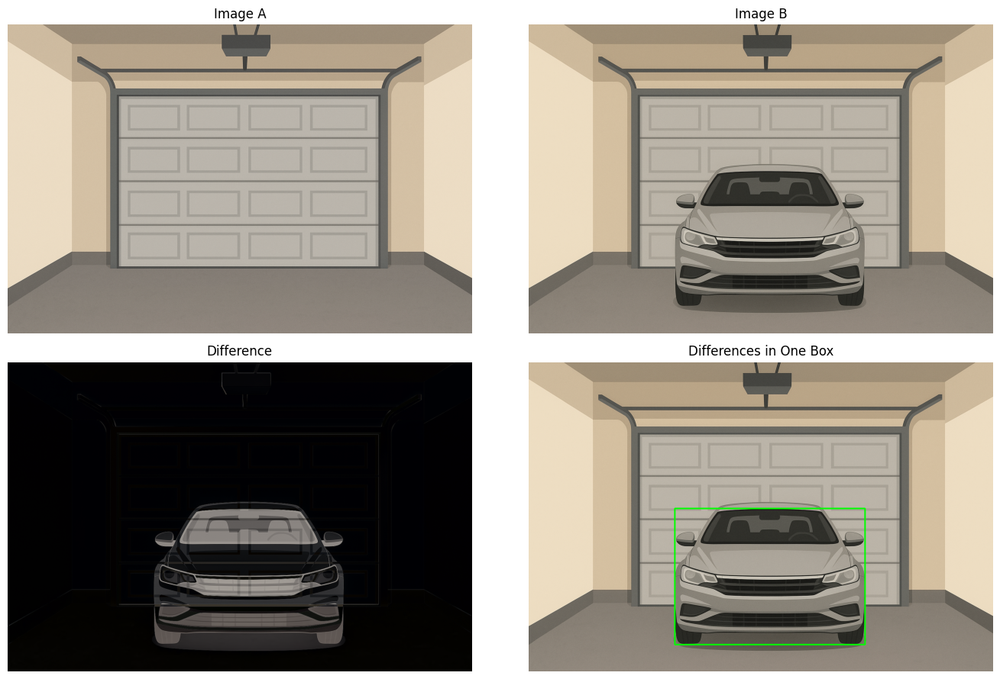

In [50]:
imgA = cv2.imread('data2/image14.png')
imgB = cv2.imread('data2/image15.png')

if imgA is None or imgB is None:
    raise FileNotFoundError("Check the image paths!")

# Resize if needed so both images match
if imgA.shape[:2] != imgB.shape[:2]:
    imgB = cv2.resize(imgB, (imgA.shape[1], imgA.shape[0]))

# --- Compute differences ---
diff = cv2.absdiff(imgA, imgB)                      # color
diff_gray = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)  # for thresholding

# --- Threshold + clean for one big box ---
blur = cv2.GaussianBlur(diff_gray, (5, 5), 0)
_, mask = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
mask = cv2.morphologyEx(mask, cv2.MORPH_DILATE, kernel, iterations=2)

# --- Draw a single rectangle that encloses all differences ---
vis = imgB.copy()
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if contours:
    x_min = min(cv2.boundingRect(c)[0] for c in contours)
    y_min = min(cv2.boundingRect(c)[1] for c in contours)
    x_max = max(cv2.boundingRect(c)[0] + cv2.boundingRect(c)[2] for c in contours)
    y_max = max(cv2.boundingRect(c)[1] + cv2.boundingRect(c)[3] for c in contours)
    cv2.rectangle(vis, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)
else:
    print("No differences found.")

# --- Plot everything ---
plt.figure(figsize=(14, 9))

plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB))
plt.title("Image A")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(imgB, cv2.COLOR_BGR2RGB))
plt.title("Image B")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(diff, cv2.COLOR_BGR2RGB))
plt.title("Difference")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
plt.title("Differences in One Box")
plt.axis("off")

plt.tight_layout()
plt.show()

### Justificación

La sustracción de imágenes se utiliza porque permite enfocar la atención únicamente en los elementos que cambian dentro de una escena, eliminando distracciones del fondo.  
Al restar una imagen de referencia del entorno con la imagen actual, se resaltan únicamente los objetos en movimiento.  

Esto resulta muy útil en aplicaciones como **videovigilancia, control de tráfico o monitoreo automático**, donde lo más importante no es el fondo estático, sino detectar con rapidez y claridad las variaciones que puedan representar un evento relevante.  


### Conclusión

A lo largo de estos ejercicios hemos explorado distintas transformaciones de imágenes y poco a poco entendimos de cómo algo tan sencillo como manipular píxeles puede cambiar por completo la información que vemos.

Al haber probado con ajustes de brillo, contraste, la transformación negativa, la ecualización de histograma y la corrección gamma, nos percatamos que no son solo filtros estéticos, sino formas de rescatar detalles que de otra manera pasarían desapercibidos. Algunos ejemplos como la transformación logarítmica nos ayudaron con imágenes de alto rango dinámico y el ajuste lineal con alpha y beta nos dio un control bastante fino sobre la intensidad.

Al final, sentimos que construimos una especie de caja de herramientas. Cada técnica tiene su lugar y, al combinarlas, no solo se mejora la calidad visual, sino que también se logra extraer información importante.

La ejecución de esta actividad nos permitió comprender que detrás de cada transformación hay una lógica que podemos aplicar según la necesidad de la imagen o del proyecto. No se trata solo de aplicar filtros al azar, sino de entender qué resultado buscamos y cómo cada técnica contribuye a ello.



### Referencias

1. Gonzalez, R. C., & Woods, R. E. (2018).  
*Intensity transformations and spatial filtering.* En *Digital image processing* (4th ed.). Pearson.  

2. Singh, R. P., & Dixit, M. (2015).  
Histogram equalization: A strong technique for image enhancement. *International Journal of Signal Processing, Image Processing and Pattern Recognition.*  
https://doi.org/10.14257/ijsip.2015.8.8.35  

3. Kang, B., Lee, S., & Paik, J. (2011).  
Adaptive height-modified histogram equalization and chroma correction in YCbCr color space for fast backlight image compensation. *IEEE Transactions on Consumer Electronics, 57*(1), 380–387.  

4. GeeksforGeeks. (s.f.).  
Intensity Transformation Operations on Images. *GeeksforGeeks.* Recuperado de:  
https://www.geeksforgeeks.org/python-intensity-transformation-operations-on-images/  

5. SpMallick, S. (s.f.).  
Simple Background Estimation in Videos using OpenCV (C++/Python). *LearnOpenCV.*  
https://learnopencv.com/simple-background-estimation-in-videos-using-opencv-c-python/  

6. Schnabel, M. (2019).  
*opencv-motion-detector:* A Python/OpenCV script that uses background subtraction to detect motion in a live feed or video. *GitHub.*  
https://github.com/markschnabel/opencv-motion-detector  


In [ ]:
...